# 2.6 Exercise 

## 1. Feed the image of the golden retriever into the horse-to-zebra model:
   ### a. What do you need to do to the image to prepare it?
   ### b. What does the output look like?

## Revision of Vit and Diffusion

### VIT

In [3]:
import torch
import torchvision
from PIL import Image
from torchvision import transforms
vit = models.vit_b_16(weights=models.ViT_B_16_Weights.IMAGENET1K_V1)


preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                        std=[0.229, 0.224, 0.225])
])

img = Image.open("bobby.png")
img_t = preprocess(img)
batch_t = torch.unsqueeze(img_t, 0)

vit.eval()
out = vit(batch_t)

with open('/Users/ankitanand/Downloads/dlwpt-code-2e-main/data/p1ch2/imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

_, index = torch.max(out, 1)
labels[index.item()]

percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index.item()], percentage[index.item()].item()

('golden retriever', 86.69854736328125)

### Diffusion

/Users/ankitanand/Documents/Learnings/Manning Books/Deep_Learning_with_Pytorch/.venv/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|██████████| 40/40 [03:00<00:00,  4.52s/it]


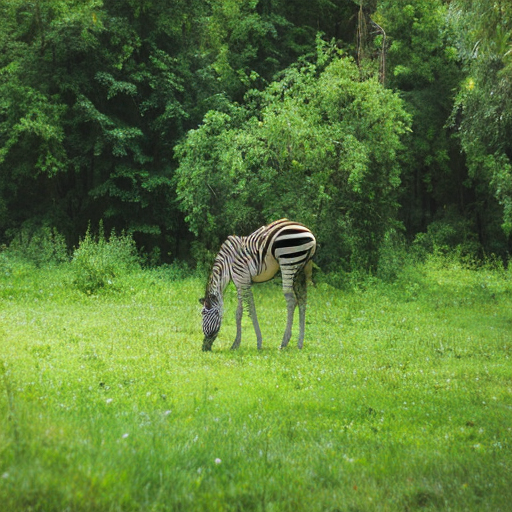

In [2]:
from diffusers import StableDiffusionInpaintPipeline
device = (
    "cuda" if torch.cuda.is_available()
    else "mps" if torch.backends.mps.is_available()
    else "cpu"
)
pipe = StableDiffusionInpaintPipeline.from_pretrained(
    "sd2-community/stable-diffusion-2-inpainting",
    torch_dtype=torch.float32
).to(device)

img = Image.open("/Users/ankitanand/Downloads/dlwpt-code-2e-main/data/p1ch2/horse.jpg")
mask_img = Image.open("/Users/ankitanand/Downloads/dlwpt-code-2e-main/data/p1ch2/horse_mask.jpg")

prompt = ("a zebra replacing the original horse, same pose, same lighting, background unchanged")
negative = "distorted background, blurry, text, watermark"

out = pipe(
    prompt=prompt,
    image=img,
    mask_image=mask_img,
    negative_prompt=negative,
    guidance_scale=7.5,
    strength=0.8,
    generator=torch.Generator(device).manual_seed(42)
)
out.images[0]

## Question 1

In [12]:
bobby_img = Image.open("bobby.png")

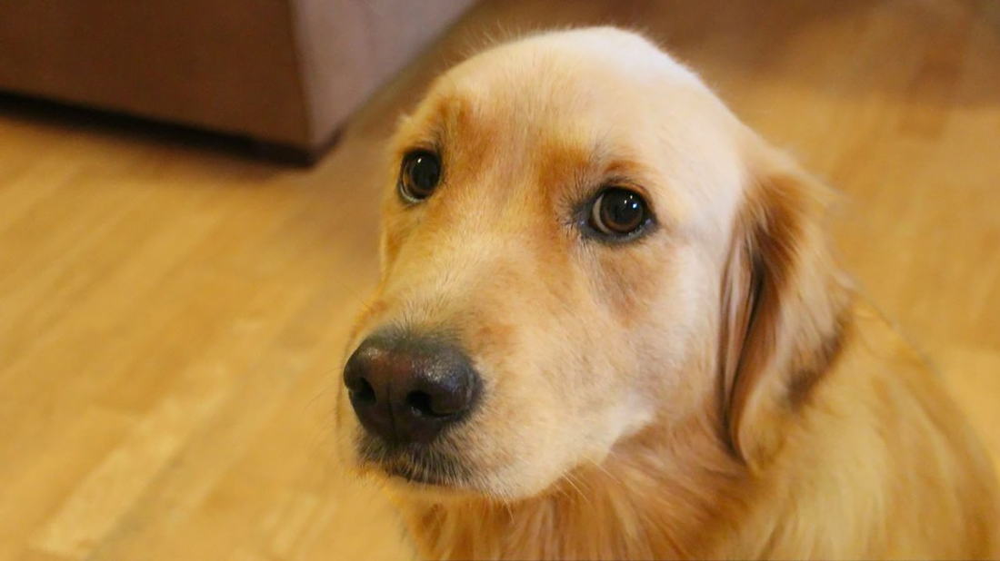

In [13]:
bobby_img

In [14]:
segmentation = models.segmentation.deeplabv3_resnet50(weights=models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT)

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /Users/ankitanand/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:03<00:00, 48.5MB/s] 


In [15]:
seg_preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [ ]:
bobby_img_preprocessed = seg_preprocess(bobby_img)

In [21]:
bobby_img_preprocessed.shape

torch.Size([3, 256, 455])

In [23]:
bobby_img_batch = torch.unsqueeze(bobby_img_preprocessed, 0)

In [24]:
bobby_img_batch.shape

torch.Size([1, 3, 256, 455])

In [25]:
segmentation.eval()

DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

In [26]:
out = segmentation(bobby_img_batch)

In [28]:
out['out'].shape

torch.Size([1, 21, 256, 455])

In [29]:
predicted_class = out['out'].argmax(dim=1)
dog_mask = predicted_class == 12

In [30]:
dog_mask.shape

torch.Size([1, 256, 455])

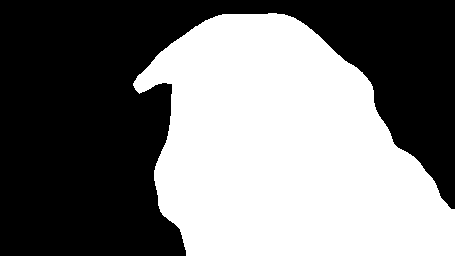

In [31]:
# Step 2.D.5 — Visualize the dog mask
mask_np = dog_mask.squeeze(0).numpy().astype('uint8') * 255
mask_pil = Image.fromarray(mask_np, mode='L')
mask_pil

In [33]:
# Step 2.D.6 — Resize mask back to Bobby's original dimensions 
bobby_img.size
mask_pil_resized = mask_pil.resize(bobby_img.size)

In [34]:
mask_pil_resized.size

(1100, 618)

100%|██████████| 40/40 [03:32<00:00,  5.30s/it]


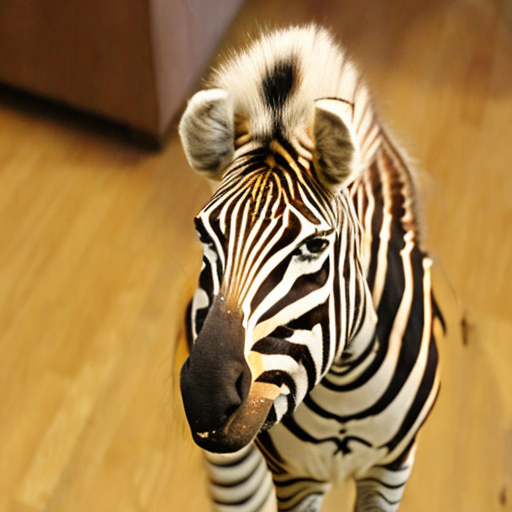

In [35]:
prompt = ("a zebra replacing the original dog, same pose, same lighting, background unchanged")
negative = "distorted background, blurry, text, watermark"

out = pipe(
    prompt=prompt,
    image=bobby_img,
    mask_image=mask_pil_resized,
    negative_prompt=negative,
    guidance_scale=7.5,
    strength=0.8,
    generator=torch.Generator(device).manual_seed(42)
)
out.images[0]

100%|██████████| 40/40 [04:18<00:00,  6.47s/it]


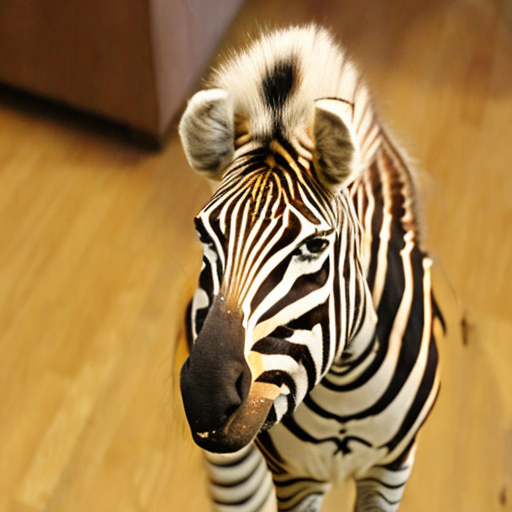

In [37]:
intermediate_images = []
capture_every = 5

def visualize_step(pipe, step, timestep, callback_kwargs):
    if step % capture_every == 0:
        latents = callback_kwargs["latents"]
        with torch.no_grad():
            decoded = pipe.vae.decode(
                latents / pipe.vae.config.scaling_factor,
                return_dict=False
            )[0]
        decoded = (decoded / 2 + 0.5).clamp(0, 1)
        decoded = decoded.cpu().permute(0, 2, 3, 1).float().numpy()
        decoded = (decoded * 255).astype("uint8")
        intermediate_images.append((step, Image.fromarray(decoded[0])))
    return callback_kwargs

bobby_out = pipe(
    prompt="a zebra replacing the original dog, same pose, same lighting, background unchanged",
    image=bobby_img,
    mask_image=mask_pil_resized,
    negative_prompt="distorted background, blurry, text, watermark",
    guidance_scale=7.5,
    strength=0.8,
    generator=torch.Generator(device).manual_seed(42),
    callback_on_step_end=visualize_step,
)
bobby_out.images[0]

Step 0


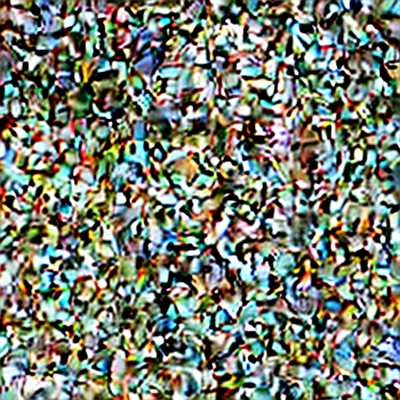

Step 5


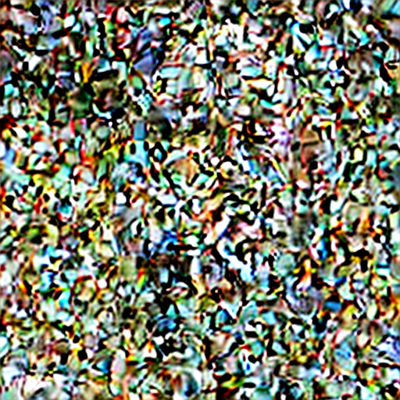

Step 10


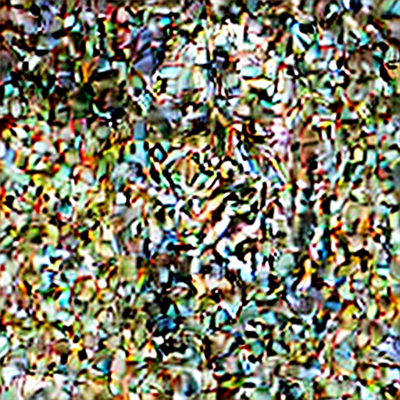

Step 15


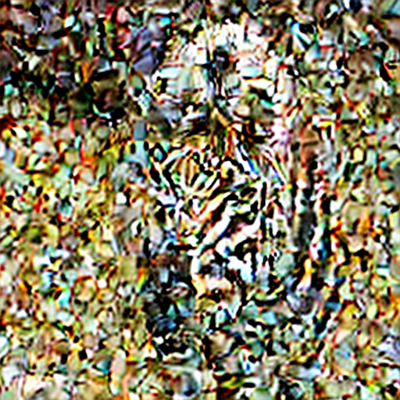

Step 20


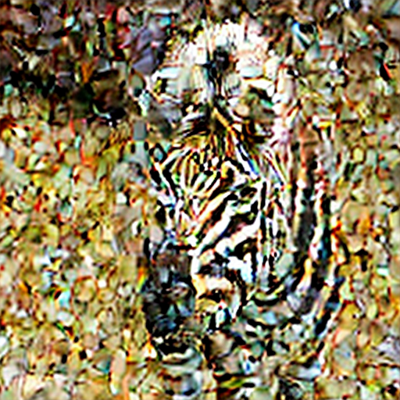

Step 25


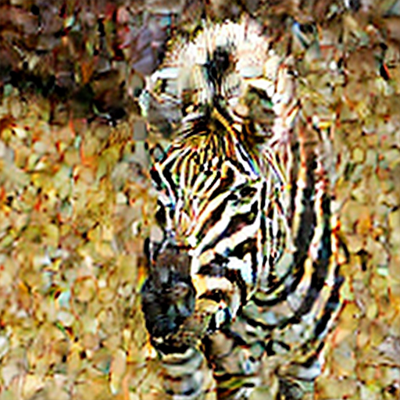

Step 30


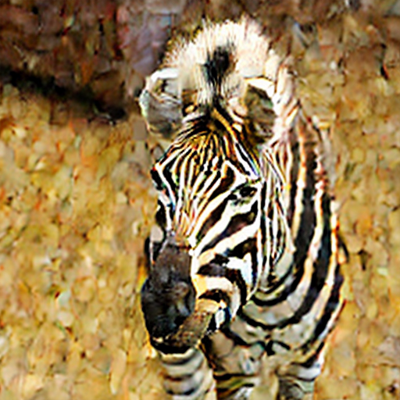

Step 35


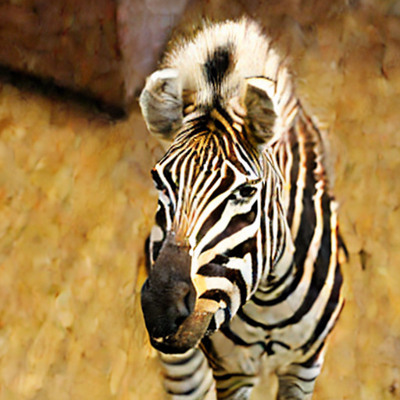

Step 40


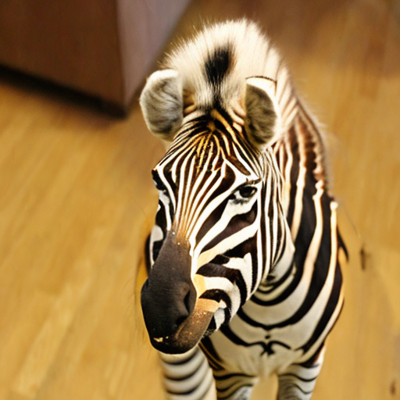

In [38]:
from IPython.display import display
for step, img in intermediate_images:
    print(f"Step {step}")
    display(img.resize((400, int(400 * img.height / img.width))))